# **Deep Learning Workshop-Assignment 1**
## **By: Roei Yehezkel, 213138787, Omri Vilan, 213479686**

# Data: Stanford Cars Dataset
## Benchmark:

Reaserching benchmark for the Stanford Cars Dataset, we have found the following accuracy results on test set:

| method| accuracy|
|--------------|--------------|
| ResNet34          |79%|
| ResNet50          |88%|
| VGG16          |84%|
| EfficientNet         | 81%|

## EDA:

In [6]:
# Dataset sizes
train_size = len(df_train)
test_size = len(df_test)
print(f"Train size: {train_size}")
print(f"Test size: {test_size}")

Train size: 8144
Test size: 8041


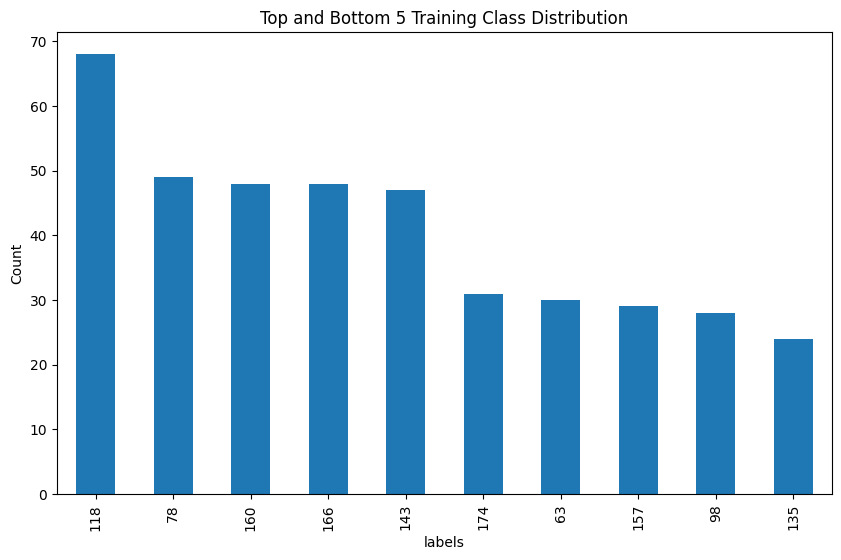

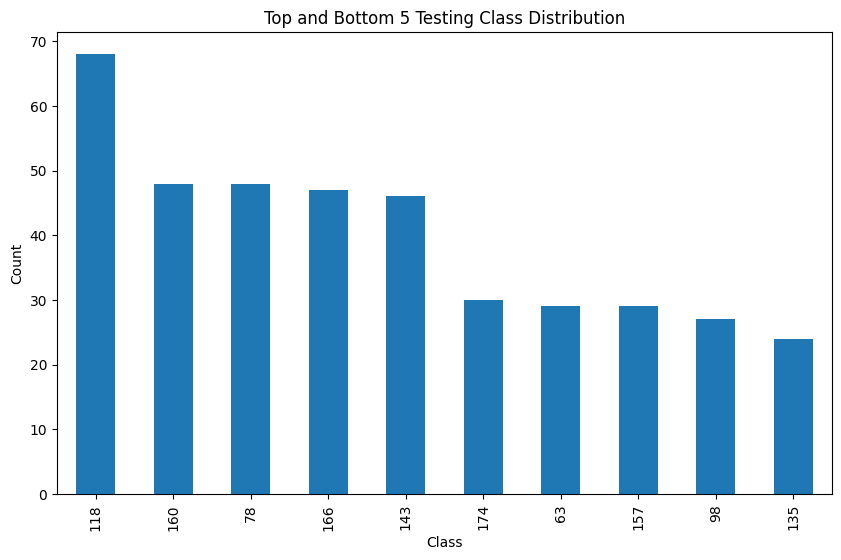

In [6]:
# Count examples per class in train and test sets
train_class_counts = df_train["class"].value_counts()
test_class_counts = df_test["class"].value_counts()

# Extract top and bottom 5 classes for training data
top_5_train = train_class_counts.head(5)
bottom_5_train = train_class_counts.tail(5)

# Extract top and bottom 5 classes for testing data
top_5_test = test_class_counts.head(5)
bottom_5_test = test_class_counts.tail(5)

# Combine top and bottom 5 for better visualization
train_to_plot = pd.concat([top_5_train, bottom_5_train])
test_to_plot = pd.concat([top_5_test, bottom_5_test])

# Plot top and bottom 5 class distribution in training data
plt.figure(figsize=(10, 6))
train_to_plot.plot(kind='bar', title="Top and Bottom 5 Training Class Distribution")
plt.xlabel("label")
plt.ylabel("Count")
plt.show()

# Plot top and bottom 5 class distribution in testing data
plt.figure(figsize=(10, 6))
test_to_plot.plot(kind='bar', title="Top and Bottom 5 Testing Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()


In [5]:
import matplotlib.pyplot as plt
from PIL import Image
# Display sample data
print(df_train.head())

# Number of unique classes
num_classes = len(df_train["class"].unique())
print(f"Number of classes: {num_classes}")

# Check if preprocessing is required
# Let's see if the images have inconsistent sizes or channels
image_shapes = []
for path in df_train["fname"].sample(10):  # Sample 10 images
    with Image.open(path) as img:
        image_shapes.append(img.size)

print(f"Sample image shapes: {image_shapes}")

# Augmentation options
from torchvision import transforms

valid_augmentations = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
])

    x1   y1    x2    y2  class                               labels  \
0   39  116   569   375     13                  Audi TTS Coupe 2012   
1   36  116   868   587      2                  Acura TL Sedan 2012   
2   85  109   601   381     90           Dodge Dakota Club Cab 2007   
3  621  393  1484  1096    133     Hyundai Sonata Hybrid Sedan 2012   
4   14   36   133    99    105  Ford F-450 Super Duty Crew Cab 2012   

                                               fname  
0  /kaggle/input/stanford-cars-dataset/cars_train...  
1  /kaggle/input/stanford-cars-dataset/cars_train...  
2  /kaggle/input/stanford-cars-dataset/cars_train...  
3  /kaggle/input/stanford-cars-dataset/cars_train...  
4  /kaggle/input/stanford-cars-dataset/cars_train...  
Number of classes: 196
Sample image shapes: [(1024, 768), (800, 531), (1024, 683), (200, 150), (575, 431), (600, 400), (1600, 1200), (314, 186), (1024, 768), (640, 480)]


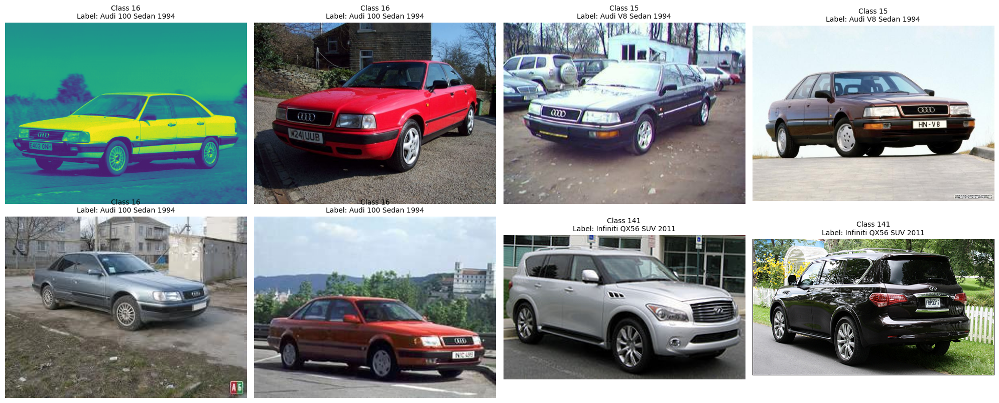

In [12]:
import matplotlib.pyplot as plt
from PIL import Image

def compare_two_pairs_with_labels(dataframe, pair1, pair2, num_samples=2):
    """
    Visualize comparisons of two class pairs with labels and class IDs.
    
    Args:
    - dataframe (pd.DataFrame): DataFrame with image file paths and class labels.
    - pair1 (tuple): First pair of classes (e.g., (16, 15)).
    - pair2 (tuple): Second pair of classes (e.g., (16, 141)).
    - num_samples (int): Number of samples to display per class in each pair.
    """
    fig, axs = plt.subplots(2, num_samples * 2, figsize=(20, 8))

    # Helper to display images with labels
    def plot_samples(cls, row_idx, col_start, title):
        cls_samples = dataframe[dataframe["class"] == cls].sample(num_samples)
        for j, (idx, row) in enumerate(cls_samples.iterrows()):
            img = Image.open(row["fname"])
            axs[row_idx, col_start + j].imshow(img)
            axs[row_idx, col_start + j].set_title(f"{title}\nLabel: {row['labels']}", fontsize=10)
            axs[row_idx, col_start + j].axis("off")

    # Pair 1: Close classes (e.g., 16 vs 15)
    plot_samples(pair1[0], row_idx=0, col_start=0, title="Class 16")
    plot_samples(pair1[1], row_idx=0, col_start=num_samples, title="Class 15")

    # Pair 2: Far classes (e.g., 16 vs 141)
    plot_samples(pair2[0], row_idx=1, col_start=0, title="Class 16")
    plot_samples(pair2[1], row_idx=1, col_start=num_samples, title="Class 141")

    plt.tight_layout()
    plt.show()

# Example usage
compare_two_pairs_with_labels(
    dataframe=df_train, 
    pair1=(16, 15), 
    pair2=(16, 141), 
    num_samples=2
)


Differencing between the 2 Audi models will be harder seperable than between each Audy compared to the Infinity model. 

In [1]:
import pandas as pd
from pathlib import Path

# Define base paths for train and test images
train_base_path = Path('/kaggle/input/stanford-cars-dataset/cars_train/cars_train')
test_base_path = Path('/kaggle/input/stanford-cars-dataset/cars_test/cars_test')

# Load the train and test labels from the provided CSV files
train_csv_path = '/kaggle/input/true-labels-cars/train_labels_and_bb.csv'
test_csv_path = '/kaggle/input/true-labels-cars/test_labels_and_bb.csv'

df_train = pd.read_csv(train_csv_path)
df_test = pd.read_csv(test_csv_path)

# Update 'fname' column to include the full paths to the images
df_train['fname'] = df_train['fname'].apply(lambda x: train_base_path / x.strip("'"))
df_test['fname'] = df_test['fname'].apply(lambda x: test_base_path / x.strip("'"))

# Zero-index the 'class' column for PyTorch compatibility
df_train['class'] -= 1
df_test['class'] -= 1

# Display the first few rows of the train and test DataFrames
print("Train DataFrame:")
print(df_train.head())

print("\nTest DataFrame:")
print(df_test.head())

Train DataFrame:
    x1   y1    x2    y2  class                               labels  \
0   39  116   569   375     13                  Audi TTS Coupe 2012   
1   36  116   868   587      2                  Acura TL Sedan 2012   
2   85  109   601   381     90           Dodge Dakota Club Cab 2007   
3  621  393  1484  1096    133     Hyundai Sonata Hybrid Sedan 2012   
4   14   36   133    99    105  Ford F-450 Super Duty Crew Cab 2012   

                                               fname  
0  /kaggle/input/stanford-cars-dataset/cars_train...  
1  /kaggle/input/stanford-cars-dataset/cars_train...  
2  /kaggle/input/stanford-cars-dataset/cars_train...  
3  /kaggle/input/stanford-cars-dataset/cars_train...  
4  /kaggle/input/stanford-cars-dataset/cars_train...  

Test DataFrame:
    x1   y1   x2   y2  class                               labels  \
0   30   52  246  147    180              Suzuki Aerio Sedan 2007   
1  100   19  576  203    102  Ferrari 458 Italia Convertible 2012   
2 

In [4]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from PIL import Image
from pathlib import Path
from matplotlib.patches import Rectangle
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import confusion_matrix,accuracy_score,log_loss
import seaborn as sns
import warnings
warnings.catch_warnings()
warnings.simplefilter("ignore")

import torch
from torchvision import datasets
from torch import nn
from torchvision.transforms import ToTensor,Lambda

## **Architecture Details**
### **Convolutional Layers**

The model consists of 4 convolutional blocks. Each block includes:
#### Convolutional Layer: Extracts spatial features with increasing depth.
#### Batch Normalization: Normalizes outputs to stabilize training and speed up convergence.
#### ReLU Activation: Introduces non-linearity, enabling the model to learn complex patterns.
#### MaxPooling: Down-samples spatial dimensions to reduce computation and focus on important features.
The depth (number of feature maps) increases progressively: 3 → 64 → 128 → 256 → 256.
Layer-by-Layer Description:

### **Layer 1:**
#### Input: 3 channels (RGB image).
#### Output: 64 feature maps.
#### Operations: Conv(3x3) → BatchNorm → ReLU → MaxPool(2x2).
### **Layer 2:**
#### Input: 64 feature maps.
#### Output: 128 feature maps.
#### Operations: Conv(3x3) → BatchNorm → ReLU → MaxPool(2x2).
### **Layer 3:**
#### Input: 128 feature maps.
#### Output: 256 feature maps.
#### Operations: Conv(3x3) → BatchNorm → ReLU → MaxPool(2x2).
### **Layer 4:**
#### Input: 256 feature maps.
#### Output: 256 feature maps.
#### Operations: Conv(3x3) → BatchNorm → ReLU → MaxPool(2x2).

## **Fully Connected Layers**

These layers combine and classify the extracted features into output categories.
Includes dropout and batch normalization to improve generalization and prevent overfitting.
## **Layer Details:**
### **Fully Connected Layer 1:**
#### Input: Flattened features from the convolutional layers.
#### Output: 512 neurons.
#### Operations: Dense → BatchNorm → ReLU → Dropout (50%).
###** Output Layer:**
#### Input: 512 neurons.
#### Output: num_classes neurons (based on the task).
#### Operations: Dense.

**Base Code:**


Fold 1/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2825, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8939, Validation Accuracy: 0.0657
[Epoch 1] Training Loss: 5.1847


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7743, Validation Accuracy: 0.0954
[Epoch 2] Training Loss: 4.2547


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5869, Validation Accuracy: 0.1277
[Epoch 3] Training Loss: 3.1406


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5168, Validation Accuracy: 0.1641
[Epoch 4] Training Loss: 1.9817


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4883, Validation Accuracy: 0.1970
[Epoch 5] Training Loss: 1.0966


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2105, Validation Accuracy: 0.1204
[Epoch 6] Training Loss: 4.0840


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.1026, Validation Accuracy: 0.1514
[Epoch 7] Training Loss: 2.0966


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.6169, Validation Accuracy: 0.2195
[Epoch 8] Training Loss: 0.5348


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3781, Validation Accuracy: 0.2559
[Epoch 9] Training Loss: 0.1480


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3333, Validation Accuracy: 0.2669
[Epoch 10] Training Loss: 0.0655


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3333, Validation Accuracy: 0.2669


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3547, Test Accuracy: 0.2601

Fold 2/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_7/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2848, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8956, Validation Accuracy: 0.0705
[Epoch 1] Training Loss: 5.1606


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7326, Validation Accuracy: 0.0942
[Epoch 2] Training Loss: 4.1929


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5452, Validation Accuracy: 0.1617
[Epoch 3] Training Loss: 3.0536


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5426, Validation Accuracy: 0.1836
[Epoch 4] Training Loss: 1.8725


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4778, Validation Accuracy: 0.2024
[Epoch 5] Training Loss: 1.0272


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.4256, Validation Accuracy: 0.0863
[Epoch 6] Training Loss: 4.0549


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.8379, Validation Accuracy: 0.1702
[Epoch 7] Training Loss: 2.0330


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.6252, Validation Accuracy: 0.2018
[Epoch 8] Training Loss: 0.4870


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3553, Validation Accuracy: 0.2565
[Epoch 9] Training Loss: 0.1281


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3179, Validation Accuracy: 0.2529
[Epoch 10] Training Loss: 0.0620


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3179, Validation Accuracy: 0.2529


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.2944, Test Accuracy: 0.2734

Fold 3/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_7/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2798, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8846, Validation Accuracy: 0.0687
[Epoch 1] Training Loss: 5.1642


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6940, Validation Accuracy: 0.0997
[Epoch 2] Training Loss: 4.2412


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5395, Validation Accuracy: 0.1574
[Epoch 3] Training Loss: 3.1536


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4875, Validation Accuracy: 0.1799
[Epoch 4] Training Loss: 1.9869


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4360, Validation Accuracy: 0.1957
[Epoch 5] Training Loss: 1.1177


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2972, Validation Accuracy: 0.1070
[Epoch 6] Training Loss: 4.1091


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.4110, Validation Accuracy: 0.1046
[Epoch 7] Training Loss: 2.2284


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.5033, Validation Accuracy: 0.2310
[Epoch 8] Training Loss: 0.6079


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3424, Validation Accuracy: 0.2608
[Epoch 9] Training Loss: 0.1531


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.2118, Validation Accuracy: 0.2711
[Epoch 10] Training Loss: 0.0675


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.2118, Validation Accuracy: 0.2711


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3064, Test Accuracy: 0.2730

Fold 4/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_7/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2773, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9280, Validation Accuracy: 0.0614
[Epoch 1] Training Loss: 5.1663


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7146, Validation Accuracy: 0.1082
[Epoch 2] Training Loss: 4.2114


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5440, Validation Accuracy: 0.1556
[Epoch 3] Training Loss: 3.0887


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5236, Validation Accuracy: 0.1739
[Epoch 4] Training Loss: 1.9292


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4961, Validation Accuracy: 0.1976
[Epoch 5] Training Loss: 1.0622


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.3449, Validation Accuracy: 0.1009
[Epoch 6] Training Loss: 4.0690


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.0348, Validation Accuracy: 0.1435
[Epoch 7] Training Loss: 2.1255


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.5309, Validation Accuracy: 0.2328
[Epoch 8] Training Loss: 0.5595


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3995, Validation Accuracy: 0.2523
[Epoch 9] Training Loss: 0.1453


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.2957, Validation Accuracy: 0.2590
[Epoch 10] Training Loss: 0.0720


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.2957, Validation Accuracy: 0.2590


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3168, Test Accuracy: 0.2701

Fold 5/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_7/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2877, Validation Accuracy: 0.0156


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8925, Validation Accuracy: 0.0687
[Epoch 1] Training Loss: 5.1402


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6816, Validation Accuracy: 0.0979
[Epoch 2] Training Loss: 4.1891


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5544, Validation Accuracy: 0.1466
[Epoch 3] Training Loss: 3.0649


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5104, Validation Accuracy: 0.1727
[Epoch 4] Training Loss: 1.9017


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4693, Validation Accuracy: 0.2032
[Epoch 5] Training Loss: 1.0369


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.1470, Validation Accuracy: 0.1338
[Epoch 6] Training Loss: 4.0937


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.0222, Validation Accuracy: 0.1612
[Epoch 7] Training Loss: 2.2129


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.6191, Validation Accuracy: 0.2117
[Epoch 8] Training Loss: 0.5989


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4473, Validation Accuracy: 0.2378
[Epoch 9] Training Loss: 0.1494


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.2742, Validation Accuracy: 0.2780
[Epoch 10] Training Loss: 0.0620


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.2742, Validation Accuracy: 0.2780


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.2408, Test Accuracy: 0.2780


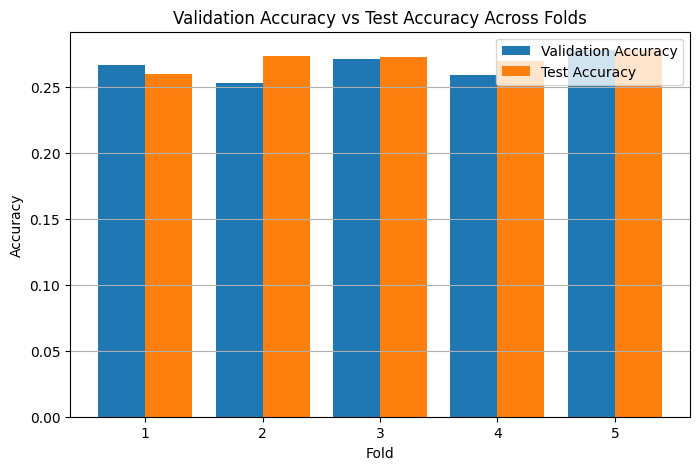

<Figure size 1000x600 with 0 Axes>

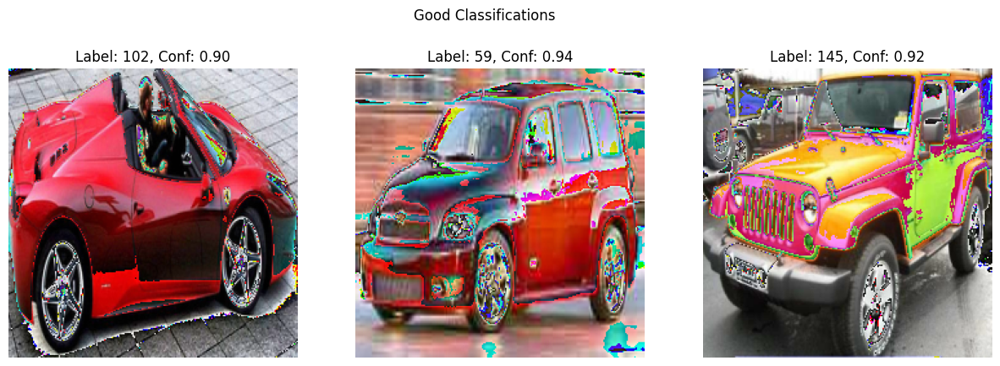

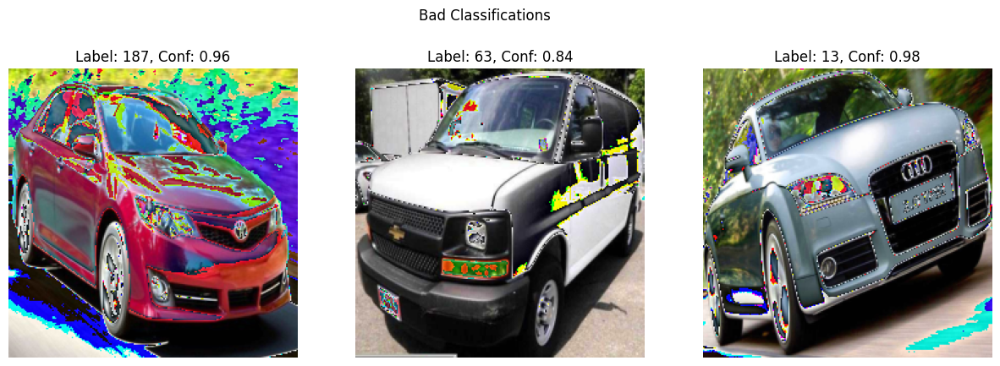

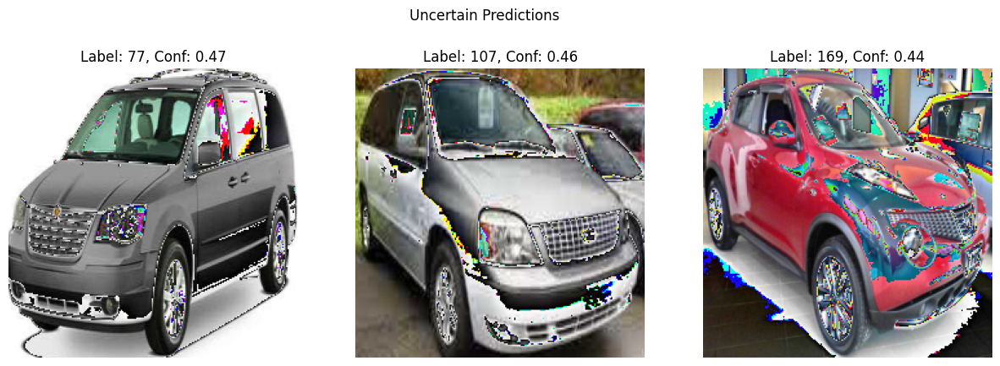


Results:
   fold   val_acc  val_loss  test_acc
0     1  0.266869  3.333312  0.260141
1     2  0.252888  3.317892  0.273415
2     3  0.271125  3.211753  0.273043
3     4  0.258967  3.295712  0.270066
4     5  0.277981  3.274250  0.278005

Mean Validation Accuracy: 0.2656
Mean Test Accuracy: 0.2709


In [13]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from sklearn.model_selection import KFold
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import transforms, functional as F
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image



# Dataset Definition
class CarsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe['fname'].iloc[idx]
        bbox = (
            int(self.dataframe['x1'].iloc[idx]),
            int(self.dataframe['y1'].iloc[idx]),
            int(self.dataframe['x2'].iloc[idx]),
            int(self.dataframe['y2'].iloc[idx]),
        )
        image = Image.open(img_path).convert('RGB')
        cropped_image = image.crop(bbox)

        if self.transform:
            cropped_image = self.transform(cropped_image)

        label = self.dataframe['class'].iloc[idx]
        return cropped_image, label


# CNN Model
class ImprovedCNN(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        dummy_input = torch.randn(1, 3, 224, 224)
        with torch.no_grad():
            feature_size = self.conv_layers(dummy_input).view(-1).size(0)

        self.fc_layers = nn.Sequential(
            nn.Linear(feature_size, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x.view(x.size(0), -1))
        return x


# Lightning Module with Logging
class CarsModel(pl.LightningModule):
    def __init__(self, num_classes):
        super(CarsModel, self).__init__()
        self.model = ImprovedCNN(num_classes)
        self.criterion = nn.CrossEntropyLoss()
        self.learning_rate = 1e-4

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def test_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = Adam(self.model.parameters(), lr=self.learning_rate)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=20)
        return [optimizer], [scheduler]
    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get('train_loss', None)
        print(f"[Epoch {self.current_epoch + 1}] Training Loss: {train_loss:.4f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get('val_loss', None)
        val_acc = self.trainer.callback_metrics.get('val_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    def on_test_epoch_end(self):
        test_loss = self.trainer.callback_metrics.get('test_loss', None)
        test_acc = self.trainer.callback_metrics.get('test_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

# Data Transforms
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Datasets and DataLoaders
train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

# K-Fold Cross Validation
k_folds = 5
batch_size = 64
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

logger = CSVLogger(save_dir="logs/", name="cars_model")
callbacks = [
    ModelCheckpoint(monitor="val_acc", mode="max", save_top_k=1),
]

fold_results = []
training_losses = []
validation_losses = []

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f"\nFold {fold + 1}/{k_folds}")

    train_subset = Subset(train_dataset, train_idx)
    val_subset = Subset(train_dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = CarsModel(num_classes=len(df_train['class'].unique()))

    trainer = pl.Trainer(
        max_epochs=10,
        accelerator="gpu",
        devices=1,
        logger=logger,
        callbacks=callbacks,
        deterministic=True,
    )

    trainer.fit(model, train_loader, val_loader)
    validation_metrics = trainer.validate(model, val_loader, verbose=False)[0]
    val_acc = validation_metrics.get("val_acc", 0.0)
    val_loss = validation_metrics.get("val_loss", 0.0)
    test_metrics = trainer.test(model, test_loader, verbose=False)[0]

    # Retrieve logged metrics for plotting
    metrics_path = f"logs/cars_model/version_0/metrics.csv"
    train_logs = pd.read_csv(metrics_path)
    
    # Extract training and validation losses directly
    fold_train_losses = train_logs["train_loss"].dropna().tolist()
    fold_val_losses = train_logs["val_loss"].dropna().tolist()

    training_losses.append(fold_train_losses)
    validation_losses.append(fold_val_losses)

    fold_results.append({
        "fold": fold + 1,
        "val_acc": val_acc,
        "val_loss": val_loss,
        "test_acc": test_metrics.get("test_acc", 0.0)
    })


# Show Examples of Classifications
def show_classification_examples(model, dataset, num_examples=3):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    good_predictions = []
    bad_predictions = []
    uncertain_predictions = []

    with torch.no_grad():
        for idx in range(len(dataset)):
            image, label = dataset[idx]
            image = image.unsqueeze(0).to(device)  # Add batch dimension
            output = model(image)
            probabilities = torch.softmax(output, dim=1).squeeze()
            predicted_label = torch.argmax(probabilities).item()
            confidence = probabilities[predicted_label].item()

            if predicted_label == label and confidence > 0.8:
                good_predictions.append((image, label, confidence))
            elif predicted_label != label and confidence > 0.8:
                bad_predictions.append((image, label, confidence))
            elif 0.4 < confidence < 0.6:
                uncertain_predictions.append((image, label, confidence))

    # Helper to plot images
    def plot_images(examples, title):
        plt.figure(figsize=(15, 5))
        for i, (img, lbl, conf) in enumerate(examples[:num_examples]):
            plt.subplot(1, num_examples, i + 1)
            plt.imshow(to_pil_image(img.squeeze(0).cpu()))
            plt.title(f"Label: {lbl}, Conf: {conf:.2f}")
            plt.axis("off")
        plt.suptitle(title)
        plt.show()

    # Plot good, bad, and uncertain examples
    plot_images(good_predictions, "Good Classifications")
    plot_images(bad_predictions, "Bad Classifications")
    plot_images(uncertain_predictions, "Uncertain Predictions")


# Convert fold results to DataFrame
fold_results_df = pd.DataFrame(fold_results)

# Plot fold results
def plot_fold_results(fold_results_df, training_losses, validation_losses):
    # Plot validation and test accuracies
    plt.figure(figsize=(8, 5))
    x = fold_results_df["fold"]
    plt.bar(x - 0.2, fold_results_df["val_acc"], width=0.4, label="Validation Accuracy", align="center")
    plt.bar(x + 0.2, fold_results_df["test_acc"], width=0.4, label="Test Accuracy", align="center")

    plt.xlabel("Fold")
    plt.ylabel("Accuracy")
    plt.title("Validation Accuracy vs Test Accuracy Across Folds")
    plt.xticks(fold_results_df["fold"])
    plt.legend()
    plt.grid(axis="y")
    plt.show()

    # Plot training vs validation losses for each fold
    epochs = list(range(1, len(training_losses[0]) + 1))
    plt.figure(figsize=(10, 6))
    


plot_fold_results(fold_results_df, training_losses, validation_losses)

# Show Classification Examples
show_classification_examples(model, test_dataset)

# Print Summary
print(f"\nResults:\n{fold_results_df}")
mean_val_acc = fold_results_df["val_acc"].mean()
mean_test_acc = fold_results_df["test_acc"].mean()

print(f"\nMean Validation Accuracy: {mean_val_acc:.4f}")
print(f"Mean Test Accuracy: {mean_test_acc:.4f}")


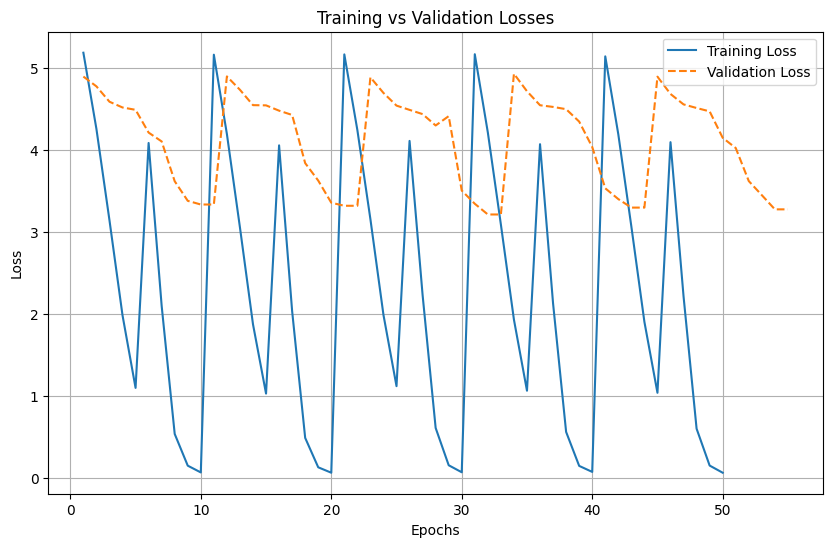

In [14]:
metrics_path = f"logs/cars_model/version_7/metrics.csv"
train_logs = pd.read_csv(metrics_path)

# Extract training and validation losses directly
fold_train_losses = train_logs["train_loss"].dropna().tolist()
fold_val_losses = train_logs["val_loss"].dropna().tolist()
import matplotlib.pyplot as plt

# Assuming `fold_train_losses` and `fold_val_losses` have been extracted
# Dynamically generate x-axis for each type of loss
epochs_train = list(range(1, len(fold_train_losses) + 1))
epochs_val = list(range(1, len(fold_val_losses) + 1))

# Plot training and validation losses
plt.figure(figsize=(10, 6))
plt.plot(epochs_train, fold_train_losses, label="Training Loss")
plt.plot(epochs_val, fold_val_losses, linestyle='--', label="Validation Loss")

# Add labels, title, and legend
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Losses")
plt.legend()
plt.grid()
plt.show()


## **Analysis of the Initial Model Performance**
### **1. Training and Validation Results**
#### **Training Performance:**
The model showed consistent improvement in training loss across all epochs and folds, with loss values decreasing steadily.
This indicates effective learning of patterns in the training data.
#### **Validation Performance:**
Validation loss plateaued early, typically around ep loss, suggesting the onset of overfitting.
Validation accuracy peaked at approximately 27% across folds, showing limited generalization to unseen data.
### **2. K-Fold Validation Metrics**
Consistency Across Folds:
Validation accuracy and loss were consistent across the 5 folds, indicating no significant bias in the dataset splits.
The mean validation accuracy across folds was 26.56%, while the validation loss averaged around 4.44.
#### **Training vs. Validation Gap:**
The gap between training and validation metrics highlights overfitting, with the model unable to generalize well beyond the training set.
### **3. Test Results**
#### **Test Accuracy:**
The mean test accuracy (approximately 27.09%) was slightly lower than validation accuracy, confirming the generalization issue.

### Note:
Classes with visually similar features (e.g., cars of the same brand but different models) were frequently misclassified, but still within the brand.

## **Suggestions for Improvement:**

### **1.Change the Model Architecture:**

Simplify the model by reducing the number of convolutional layers or decreasing the number of neurons in the fully connected layers. A simpler model architecture reduces the risk of overfitting, and pretrained models bring robust, generalized feature extraction.

### **2.Data Augmentation (Overfitting):**

Use aggressive augmentation techniques during training, such as cropping, rotation and color jittering. The data augmentation exposes the model to a wider variety of training data distributions, improving generalization.

### **3.Model Regularization:**


*   Increase dropout rates in the fully connected layers (e.g., from 50% to 60%) and add dropout layers after convolutional blocks to randomly deactivate neurons during training.

*   Implement early stopping based on validation loss to terminate training when overfitting begins.


Regularization discourages over-reliance on specific features and prevents memorization of the training set.
ture extraction.


### Change #1: decreasing neuron number in linear & convolutional layers


In [11]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from sklearn.model_selection import KFold
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import transforms
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint

# Dataset Definition
class CarsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe['fname'].iloc[idx]
        bbox = (
            int(self.dataframe['x1'].iloc[idx]),
            int(self.dataframe['y1'].iloc[idx]),
            int(self.dataframe['x2'].iloc[idx]),
            int(self.dataframe['y2'].iloc[idx]),
        )
        image = Image.open(img_path).convert('RGB')
        cropped_image = image.crop(bbox)

        if self.transform:
            cropped_image = self.transform(cropped_image)

        label = self.dataframe['class'].iloc[idx]
        return cropped_image, label

# CNN Model (Unchanged)
class ImprovedCNN(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),  # Additional convolutional layer
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Block 2
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),  # Additional convolutional layer
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        # Dynamically calculate feature size after convolutions
        dummy_input = torch.randn(1, 3, 224, 224)
        with torch.no_grad():
            feature_size = self.conv_layers(dummy_input).view(-1).size(0)

        self.fc_layers = nn.Sequential(
            nn.Linear(feature_size, 128),  # Increased dimensionality
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x.view(x.size(0), -1))
        return x



# Lightning Module with Logs
# Lightning Module with Logs and Epoch-Level Prints
class CarsModel(pl.LightningModule):
    def __init__(self, num_classes):
        super(CarsModel, self).__init__()
        self.model = ImprovedCNN(num_classes)
        self.criterion = nn.CrossEntropyLoss()
        self.learning_rate = 1e-4

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"val_loss": loss, "val_acc": acc}

    def test_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"test_loss": loss, "test_acc": acc}

    def configure_optimizers(self):
        optimizer = Adam(self.model.parameters(), lr=self.learning_rate)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=20)
        return [optimizer], [scheduler]

    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get('train_loss', None)
        print(f"[Epoch {self.current_epoch + 1}] Training Loss: {train_loss:.4f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get('val_loss', None)
        val_acc = self.trainer.callback_metrics.get('val_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    def on_test_epoch_end(self):
        test_loss = self.trainer.callback_metrics.get('test_loss', None)
        test_acc = self.trainer.callback_metrics.get('test_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")



# Data Transforms
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


# Datasets and DataLoaders
train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

# K-Fold Cross Validation
k_folds = 5
batch_size = 64
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

logger = CSVLogger(save_dir="logs/", name="cars_model")
callbacks = [
    ModelCheckpoint(monitor="val_acc", mode="max", save_top_k=1)
]

fold_results = []

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f"\nFold {fold + 1}/{k_folds}")

    train_subset = Subset(train_dataset, train_idx)
    val_subset = Subset(train_dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = CarsModel(num_classes=len(df_train['class'].unique()))

    trainer = pl.Trainer(
        max_epochs=10,
        accelerator="gpu",
        devices=1,
        logger=logger,
        callbacks=callbacks,
        deterministic=True,
    )

    trainer.fit(model, train_loader, val_loader)
    validation_metrics = trainer.validate(model, val_loader, verbose=False)[0]
    val_acc = validation_metrics.get("val_acc", 0.0)
    val_loss = validation_metrics.get("val_loss", 0.0)
    test_metrics = trainer.test(model, test_loader, verbose=False)[0]

    fold_results.append({
    "fold": fold + 1,
    "val_acc": val_acc,
    "val_loss": val_loss,
    "test_acc": test_metrics.get("test_acc", 0.0)
})


# Print summary of results
fold_results_df = pd.DataFrame(fold_results)
print(f"\nResults:\n{fold_results_df}")

mean_val_acc = fold_results_df["val_acc"].mean()
mean_test_acc = fold_results_df["test_acc"].mean()

print(f"\nMean Validation Accuracy: {mean_val_acc:.4f}")
print(f"Mean Test Accuracy: {mean_test_acc:.4f}")



Fold 1/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2824, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.1571, Validation Accuracy: 0.0172
[Epoch 1] Training Loss: 5.3141


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.0787, Validation Accuracy: 0.0270
[Epoch 2] Training Loss: 4.8268


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.0576, Validation Accuracy: 0.0491
[Epoch 3] Training Loss: 4.0422


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.0490, Validation Accuracy: 0.0589
[Epoch 4] Training Loss: 3.3160


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.0377, Validation Accuracy: 0.0663
[Epoch 5] Training Loss: 2.8124


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.0351, Validation Accuracy: 0.0816
[Epoch 6] Training Loss: 2.4811


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0342, Validation Accuracy: 0.0859
[Epoch 7] Training Loss: 2.4165


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0301, Validation Accuracy: 0.0896
[Epoch 8] Training Loss: 2.3712


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 5.0299, Validation Accuracy: 0.0853
[Epoch 9] Training Loss: 2.3054


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 5.0241, Validation Accuracy: 0.0915
[Epoch 10] Training Loss: 2.2618


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 5.0241, Validation Accuracy: 0.0915


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 5.0115, Test Accuracy: 0.0961

Fold 2/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2873, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.1486, Validation Accuracy: 0.0276
[Epoch 1] Training Loss: 5.3018


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.0714, Validation Accuracy: 0.0387
[Epoch 2] Training Loss: 4.8218


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.0250, Validation Accuracy: 0.0528
[Epoch 3] Training Loss: 3.9942


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.0216, Validation Accuracy: 0.0816
[Epoch 4] Training Loss: 3.2551


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.0239, Validation Accuracy: 0.0847
[Epoch 5] Training Loss: 2.7875


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.0239, Validation Accuracy: 0.0896
[Epoch 6] Training Loss: 2.4588


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0177, Validation Accuracy: 0.0902
[Epoch 7] Training Loss: 2.3980


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0167, Validation Accuracy: 0.0915
[Epoch 8] Training Loss: 2.3368


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 5.0122, Validation Accuracy: 0.0964
[Epoch 9] Training Loss: 2.2905


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 5.0104, Validation Accuracy: 0.0982
[Epoch 10] Training Loss: 2.2551


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 5.0104, Validation Accuracy: 0.0982


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 5.0233, Test Accuracy: 0.0922

Fold 3/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2784, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.1733, Validation Accuracy: 0.0215
[Epoch 1] Training Loss: 5.3149


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.0826, Validation Accuracy: 0.0448
[Epoch 2] Training Loss: 4.7858


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.0570, Validation Accuracy: 0.0485
[Epoch 3] Training Loss: 3.9487


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.0695, Validation Accuracy: 0.0694
[Epoch 4] Training Loss: 3.2313


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.0483, Validation Accuracy: 0.0743
[Epoch 5] Training Loss: 2.7639


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.0515, Validation Accuracy: 0.0829
[Epoch 6] Training Loss: 2.4318


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0450, Validation Accuracy: 0.0878
[Epoch 7] Training Loss: 2.3857


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0442, Validation Accuracy: 0.0872
[Epoch 8] Training Loss: 2.3399


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 5.0431, Validation Accuracy: 0.0909
[Epoch 9] Training Loss: 2.2789


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 5.0421, Validation Accuracy: 0.0866
[Epoch 10] Training Loss: 2.2320


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 5.0421, Validation Accuracy: 0.0866


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 5.0325, Test Accuracy: 0.0892

Fold 4/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2773, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.1333, Validation Accuracy: 0.0270
[Epoch 1] Training Loss: 5.2886


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.1185, Validation Accuracy: 0.0289
[Epoch 2] Training Loss: 4.7225


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.0688, Validation Accuracy: 0.0430
[Epoch 3] Training Loss: 3.8746


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.0664, Validation Accuracy: 0.0571
[Epoch 4] Training Loss: 3.2099


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.0521, Validation Accuracy: 0.0589
[Epoch 5] Training Loss: 2.7416


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.0521, Validation Accuracy: 0.0810
[Epoch 6] Training Loss: 2.4398


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0478, Validation Accuracy: 0.0890
[Epoch 7] Training Loss: 2.3677


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0462, Validation Accuracy: 0.0866
[Epoch 8] Training Loss: 2.3361


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 5.0436, Validation Accuracy: 0.0878
[Epoch 9] Training Loss: 2.2700


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 5.0408, Validation Accuracy: 0.0884
[Epoch 10] Training Loss: 2.2302


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 5.0408, Validation Accuracy: 0.0884


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 5.0269, Test Accuracy: 0.0893

Fold 5/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2749, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.1499, Validation Accuracy: 0.0240
[Epoch 1] Training Loss: 5.3088


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.0813, Validation Accuracy: 0.0399
[Epoch 2] Training Loss: 4.8279


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.0331, Validation Accuracy: 0.0571
[Epoch 3] Training Loss: 4.0077


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.0576, Validation Accuracy: 0.0676
[Epoch 4] Training Loss: 3.2579


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.0378, Validation Accuracy: 0.0713
[Epoch 5] Training Loss: 2.7682


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.0347, Validation Accuracy: 0.0860
[Epoch 6] Training Loss: 2.4677


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0296, Validation Accuracy: 0.0885
[Epoch 7] Training Loss: 2.3833


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0248, Validation Accuracy: 0.0915
[Epoch 8] Training Loss: 2.3446


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 5.0218, Validation Accuracy: 0.0934
[Epoch 9] Training Loss: 2.2980


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 5.0238, Validation Accuracy: 0.0903
[Epoch 10] Training Loss: 2.2451


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 5.0238, Validation Accuracy: 0.0903


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 5.0157, Test Accuracy: 0.0960

Results:
   fold   val_acc  val_loss  test_acc
0     1  0.091467  5.024062  0.096132
1     2  0.098220  5.010448  0.092153
2     3  0.086556  5.042137  0.089168
3     4  0.088398  5.040771  0.089292
4     5  0.090295  5.023756  0.096008

Mean Validation Accuracy: 0.0910
Mean Test Accuracy: 0.0926


| fold| original model accuracy | accuracy with decreased neuron number|
|--------------|--------------|-----------------|
| 1          | 26.01%  | 9.61%          |
| 2          | 27.34%  | 9.21%          |
| 3          | 27.04%  | 8.92%          |
| 4          | 27.00%  | 8.93%          |
| 5          | 27.80%  | 9.60%          |


Unfortunately, decreaseing the neurons, with an intention of reducing overfit, brought the model to a state of underfitting-meaning the network width isn't the reason for overfitting. future improvements will include increasing the number of layers neurons each layer close to the original size.

### **Change #2: improved augmentation**


In [3]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from sklearn.model_selection import KFold
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import transforms
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint

# Dataset Definition
class CarsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe['fname'].iloc[idx]
        bbox = (
            int(self.dataframe['x1'].iloc[idx]),
            int(self.dataframe['y1'].iloc[idx]),
            int(self.dataframe['x2'].iloc[idx]),
            int(self.dataframe['y2'].iloc[idx]),
        )
        image = Image.open(img_path).convert('RGB')
        cropped_image = image.crop(bbox)

        if self.transform:
            cropped_image = self.transform(cropped_image)

        label = self.dataframe['class'].iloc[idx]
        return cropped_image, label

# CNN Model (Unchanged)
class ImprovedCNN(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        # Dynamically calculate feature size
        dummy_input = torch.randn(1, 3, 224, 224)
        with torch.no_grad():
            feature_size = self.conv_layers(dummy_input).view(-1).size(0)

        self.fc_layers = nn.Sequential(
            nn.Linear(feature_size, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x.view(x.size(0), -1))
        return x


# Lightning Module with Logs
class CarsModel(pl.LightningModule):
    def __init__(self, num_classes):
        super(CarsModel, self).__init__()
        self.model = ImprovedCNN(num_classes)
        self.criterion = nn.CrossEntropyLoss()
        self.learning_rate = 1e-6

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        return loss

    def test_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=False, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = Adam(self.model.parameters(), lr=self.learning_rate)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=20)
        return [optimizer], [scheduler]
    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get('train_loss', None)
        print(f"[Epoch {self.current_epoch + 1}] Training Loss: {train_loss:.4f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get('val_loss', None)
        val_acc = self.trainer.callback_metrics.get('val_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    def on_test_epoch_end(self):
        test_loss = self.trainer.callback_metrics.get('test_loss', None)
        test_acc = self.trainer.callback_metrics.get('test_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")


# Data Transforms
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(degrees=10, scale=(0.9, 1.1)),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Datasets and DataLoaders
train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)
# K-Fold Cross Validation
k_folds = 5
batch_size = 64
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

logger = CSVLogger(save_dir="logs/", name="cars_model")
callbacks = [
    ModelCheckpoint(monitor="val_acc", mode="max", save_top_k=1),
]

fold_results = []

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f"\nFold {fold + 1}/{k_folds}")

    train_subset = Subset(train_dataset, train_idx)
    val_subset = Subset(train_dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = CarsModel(num_classes=len(df_train['class'].unique()))

    trainer = pl.Trainer(
        max_epochs=10,
        accelerator="gpu",
        devices=1,
        logger=logger,
        callbacks=callbacks,
        deterministic=True,
    )

    trainer.fit(model, train_loader, val_loader)
    validation_metrics = trainer.validate(model, val_loader, verbose=False)[0]
    val_acc = validation_metrics.get("val_acc", 0.0)
    val_loss = validation_metrics.get("val_loss", 0.0)
    test_metrics = trainer.test(model, test_loader, verbose=False)[0]

    fold_results.append({
    "fold": fold + 1,
    "val_acc": val_acc,
    "val_loss": val_loss,
    "test_acc": test_metrics.get("test_acc", 0.0)
})


# Print summary of results
fold_results_df = pd.DataFrame(fold_results)
print(f"\nResults:\n{fold_results_df}")

mean_val_acc = fold_results_df["val_acc"].mean()
mean_test_acc = fold_results_df["test_acc"].mean()

print(f"\nMean Validation Accuracy: {mean_val_acc:.4f}")
print(f"Mean Test Accuracy: {mean_test_acc:.4f}")



Fold 1/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2765, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.3325, Validation Accuracy: 0.0049
[Epoch 1] Training Loss: 5.4333


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.2866, Validation Accuracy: 0.0086
[Epoch 2] Training Loss: 5.4096


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.2858, Validation Accuracy: 0.0092
[Epoch 3] Training Loss: 5.3740


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.2607, Validation Accuracy: 0.0110
[Epoch 4] Training Loss: 5.3435


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.2585, Validation Accuracy: 0.0086
[Epoch 5] Training Loss: 5.3255


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.1307, Validation Accuracy: 0.0246
[Epoch 6] Training Loss: 5.2368


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0681, Validation Accuracy: 0.0344
[Epoch 7] Training Loss: 5.0959


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 4.9886, Validation Accuracy: 0.0374
[Epoch 8] Training Loss: 4.9786


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 4.9630, Validation Accuracy: 0.0516
[Epoch 9] Training Loss: 4.8815


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 4.9195, Validation Accuracy: 0.0534
[Epoch 10] Training Loss: 4.8200


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 4.9044, Validation Accuracy: 0.0571


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 4.8873, Test Accuracy: 0.0621

Fold 2/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_1/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2820, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.3160, Validation Accuracy: 0.0049
[Epoch 1] Training Loss: 5.4149


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.2963, Validation Accuracy: 0.0068
[Epoch 2] Training Loss: 5.3801


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.2883, Validation Accuracy: 0.0123
[Epoch 3] Training Loss: 5.3653


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.2863, Validation Accuracy: 0.0098
[Epoch 4] Training Loss: 5.3341


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.2550, Validation Accuracy: 0.0074
[Epoch 5] Training Loss: 5.3046


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.1342, Validation Accuracy: 0.0221
[Epoch 6] Training Loss: 5.2265


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0256, Validation Accuracy: 0.0319
[Epoch 7] Training Loss: 5.0641


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 4.9763, Validation Accuracy: 0.0473
[Epoch 8] Training Loss: 4.9502


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 4.9302, Validation Accuracy: 0.0534
[Epoch 9] Training Loss: 4.8836


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 4.8888, Validation Accuracy: 0.0595
[Epoch 10] Training Loss: 4.8002


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 4.8971, Validation Accuracy: 0.0534


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 4.8758, Test Accuracy: 0.0660

Fold 3/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2805, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.3376, Validation Accuracy: 0.0068
[Epoch 1] Training Loss: 5.4285


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.3111, Validation Accuracy: 0.0092
[Epoch 2] Training Loss: 5.4054


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.2833, Validation Accuracy: 0.0086
[Epoch 3] Training Loss: 5.3613


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.2712, Validation Accuracy: 0.0074
[Epoch 4] Training Loss: 5.3324


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.2444, Validation Accuracy: 0.0104
[Epoch 5] Training Loss: 5.3039


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.1339, Validation Accuracy: 0.0264
[Epoch 6] Training Loss: 5.2260


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0646, Validation Accuracy: 0.0258
[Epoch 7] Training Loss: 5.0768


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0104, Validation Accuracy: 0.0381
[Epoch 8] Training Loss: 4.9707


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 4.9618, Validation Accuracy: 0.0442
[Epoch 9] Training Loss: 4.8842


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 4.9274, Validation Accuracy: 0.0534
[Epoch 10] Training Loss: 4.8058


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 4.9348, Validation Accuracy: 0.0485


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 4.8922, Test Accuracy: 0.0591

Fold 4/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2790, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.3529, Validation Accuracy: 0.0049
[Epoch 1] Training Loss: 5.4336


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.3228, Validation Accuracy: 0.0061
[Epoch 2] Training Loss: 5.4053


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.3035, Validation Accuracy: 0.0031
[Epoch 3] Training Loss: 5.3705


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.2972, Validation Accuracy: 0.0068
[Epoch 4] Training Loss: 5.3478


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.2816, Validation Accuracy: 0.0080
[Epoch 5] Training Loss: 5.3174


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.1658, Validation Accuracy: 0.0178
[Epoch 6] Training Loss: 5.2480


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0642, Validation Accuracy: 0.0270
[Epoch 7] Training Loss: 5.0820


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 5.0035, Validation Accuracy: 0.0491
[Epoch 8] Training Loss: 4.9805


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 4.9277, Validation Accuracy: 0.0552
[Epoch 9] Training Loss: 4.8935


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 4.8883, Validation Accuracy: 0.0583
[Epoch 10] Training Loss: 4.8146


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 4.8864, Validation Accuracy: 0.0608


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 4.8799, Test Accuracy: 0.0631

Fold 5/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2779, Validation Accuracy: 0.0156


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.3275, Validation Accuracy: 0.0049
[Epoch 1] Training Loss: 5.4228


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 5.3099, Validation Accuracy: 0.0037
[Epoch 2] Training Loss: 5.4034


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 5.3009, Validation Accuracy: 0.0080
[Epoch 3] Training Loss: 5.3625


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 5.2721, Validation Accuracy: 0.0104
[Epoch 4] Training Loss: 5.3432


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 5.2409, Validation Accuracy: 0.0172
[Epoch 5] Training Loss: 5.3304


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 5.1410, Validation Accuracy: 0.0233
[Epoch 6] Training Loss: 5.2444


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 5.0340, Validation Accuracy: 0.0344
[Epoch 7] Training Loss: 5.0836


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 4.9850, Validation Accuracy: 0.0442
[Epoch 8] Training Loss: 4.9806


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 4.9370, Validation Accuracy: 0.0467
[Epoch 9] Training Loss: 4.8897


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 4.8995, Validation Accuracy: 0.0584
[Epoch 10] Training Loss: 4.8163


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 4.8989, Validation Accuracy: 0.0553


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 4.8942, Test Accuracy: 0.0578

Results:
   fold   val_acc  val_loss  test_acc
0     1  0.057090  4.904351  0.062057
1     2  0.053407  4.897075  0.066037
2     3  0.048496  4.934772  0.059072
3     4  0.060773  4.886354  0.063052
4     5  0.055283  4.898909  0.057829

Mean Validation Accuracy: 0.0550
Mean Test Accuracy: 0.0616


| fold| original model accuracy | accuracy with decreased neuron number|
|--------------|--------------|-----------------|
| 1          | 26.01%  | 6.21%          |
| 2          | 27.34%  | 6.60%          |
| 3          | 27.04%  | 5.91%          |
| 4          | 27.00%  | 6.31%          |
| 5          | 27.80%  | 5.78%          |


Unfortunately, adding augmentation, with an intention of making better generalization, brought the model to a state of underfitting aswell, even wors than the first suggestion. future improvements will include removing the extra augmentation.
Both changes #1 and #2 didn't return the desired result-the overfitting assumption based on original model result was wrong!

### **Change #3: inference-time-augmentation (aggregation of multiple predictions on augmented test examples)**:

In [2]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from sklearn.model_selection import KFold
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import transforms, functional as F
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint

# Dataset Definition
class CarsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe['fname'].iloc[idx]
        bbox = (
            int(self.dataframe['x1'].iloc[idx]),
            int(self.dataframe['y1'].iloc[idx]),
            int(self.dataframe['x2'].iloc[idx]),
            int(self.dataframe['y2'].iloc[idx]),
        )
        image = Image.open(img_path).convert('RGB')
        cropped_image = image.crop(bbox)

        if self.transform:
            cropped_image = self.transform(cropped_image)

        label = self.dataframe['class'].iloc[idx]
        return cropped_image, label

# CNN Model
class ImprovedCNN(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        dummy_input = torch.randn(1, 3, 224, 224)
        with torch.no_grad():
            feature_size = self.conv_layers(dummy_input).view(-1).size(0)

        self.fc_layers = nn.Sequential(
            nn.Linear(feature_size, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x.view(x.size(0), -1))
        return x

# Lightning Module
class CarsModel(pl.LightningModule):
    def __init__(self, num_classes):
        super(CarsModel, self).__init__()
        self.model = ImprovedCNN(num_classes)
        self.criterion = nn.CrossEntropyLoss()
        self.learning_rate = 1e-4

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_epoch=True, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self.model(images)
        loss = self.criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()
        self.log('test_loss', loss, on_epoch=True)
        self.log('test_acc', acc, on_epoch=True)
        return loss

    def configure_optimizers(self):
        optimizer = Adam(self.model.parameters(), lr=self.learning_rate)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=20)
        return [optimizer], [scheduler]
    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get('train_loss', None)
        print(f"[Epoch {self.current_epoch + 1}] Training Loss: {train_loss:.4f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get('val_loss', None)
        val_acc = self.trainer.callback_metrics.get('val_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    def on_test_epoch_end(self):
        test_loss = self.trainer.callback_metrics.get('test_loss', None)
        test_acc = self.trainer.callback_metrics.get('test_acc', None)
        print(f"[Epoch {self.current_epoch + 1}] Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

# Data Transforms
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Datasets and DataLoaders
train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

# K-Fold Cross Validation
k_folds = 5
batch_size = 64
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

logger = CSVLogger(save_dir="logs/", name="cars_model")
callbacks = [ModelCheckpoint(monitor="val_acc", mode="max", save_top_k=1)]
fold_results = []

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f"\nFold {fold + 1}/{k_folds}")
    train_subset = Subset(train_dataset, train_idx)
    val_subset = Subset(train_dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = CarsModel(num_classes=len(df_train['class'].unique()))

    trainer = pl.Trainer(
        max_epochs=10,
        accelerator="gpu",
        devices=1,
        logger=logger,
        callbacks=callbacks,
        deterministic=True,
    )

    trainer.fit(model, train_loader, val_loader)
    validation_metrics = trainer.validate(model, val_loader, verbose=False)[0]
    val_acc = validation_metrics.get("val_acc", 0.0)
    val_loss = validation_metrics.get("val_loss", 0.0)

    test_metrics = trainer.test(model, test_loader, verbose=False)[0]
    fold_results.append(test_metrics)

    # ITA Implementation
    inference_augmentations = [
        transforms.RandomHorizontalFlip(p=1),
        transforms.RandomVerticalFlip(p=1),
        transforms.RandomRotation(degrees=15),
        transforms.RandomAffine(degrees=10, scale=(0.9, 1.1)),
    ]

    def inference_time_augmentation(model, dataset, augmentations, num_classes):
        """
        Apply inference-time augmentation with aggregation of multiple predictions.

        Args:
        - model: Trained PyTorch model.
        - dataset: PyTorch dataset (test dataset).
        - augmentations: List of augmentation transformations.
        - num_classes: Number of classes in the dataset.

        Returns:
        - accuracy: Final accuracy after aggregation.
        - all_labels: True labels.
        - aggregated_predictions: Final aggregated predictions.
        """
        model.eval()
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model = model.to(device)

        all_labels = []
        aggregated_predictions = []

        for idx in range(len(dataset)):
            image, label = dataset[idx]
            all_labels.append(label)
            image = image.unsqueeze(0).to(device)  # Add batch dimension

            # List to store predictions for each augmented version
            softmax_predictions = []
            with torch.no_grad():
                # Add prediction for the original image
                output = model(image)
                softmax_predictions.append(torch.softmax(output, dim=1).cpu().numpy())

                # Add predictions for augmented versions
                for aug in augmentations:
                    augmented_image = aug(image.cpu())  # Apply augmentation
                    output = model(augmented_image.to(device))
                    softmax_predictions.append(torch.softmax(output, dim=1).cpu().numpy())

            # Aggregate predictions (average probabilities)
            aggregated_probabilities = np.mean(np.vstack(softmax_predictions), axis=0)
            aggregated_predictions.append(aggregated_probabilities)

        # Convert probabilities to class indices
        aggregated_predictions = np.argmax(np.array(aggregated_predictions), axis=1)
        all_labels = np.array(all_labels)

        # Calculate accuracy
        accuracy = np.mean(aggregated_predictions == all_labels)
        return accuracy, all_labels, aggregated_predictions

    # Evaluate ITA
    ita_acc, all_labels, aggregated_preds = inference_time_augmentation(
        model=model,
        dataset=test_dataset,
        augmentations=inference_augmentations,
        num_classes=len(df_train['class'].unique())
    )

    print(f"\nInference-Time Augmentation (ITA) Accuracy: {ita_acc:.4f}")
    fold_results.append({
        "fold": fold + 1,
        "val_acc": val_acc,
        "val_loss": val_loss,
        "ita_test_acc": ita_acc
    })




Fold 1/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2818, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9167, Validation Accuracy: 0.0516
[Epoch 1] Training Loss: 5.1704


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7210, Validation Accuracy: 0.0884
[Epoch 2] Training Loss: 4.2570


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5765, Validation Accuracy: 0.1301
[Epoch 3] Training Loss: 3.1548


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5249, Validation Accuracy: 0.1614
[Epoch 4] Training Loss: 1.9952


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4758, Validation Accuracy: 0.1854
[Epoch 5] Training Loss: 1.1127


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2013, Validation Accuracy: 0.1154
[Epoch 6] Training Loss: 4.1073


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.9469, Validation Accuracy: 0.1430
[Epoch 7] Training Loss: 2.1876


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.6882, Validation Accuracy: 0.2001
[Epoch 8] Training Loss: 0.5835


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4053, Validation Accuracy: 0.2462
[Epoch 9] Training Loss: 0.1487


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3512, Validation Accuracy: 0.2566
[Epoch 10] Training Loss: 0.0691


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3512, Validation Accuracy: 0.2566


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.4113, Test Accuracy: 0.2481

Inference-Time Augmentation (ITA) Accuracy: 0.2853

Fold 2/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_0/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2787, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8781, Validation Accuracy: 0.0552
[Epoch 1] Training Loss: 5.1460


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6771, Validation Accuracy: 0.1001
[Epoch 2] Training Loss: 4.2189


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5451, Validation Accuracy: 0.1393
[Epoch 3] Training Loss: 3.1431


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4906, Validation Accuracy: 0.1596
[Epoch 4] Training Loss: 1.9671


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4986, Validation Accuracy: 0.1762
[Epoch 5] Training Loss: 1.0973


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2224, Validation Accuracy: 0.1172
[Epoch 6] Training Loss: 4.0888


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.0981, Validation Accuracy: 0.1572
[Epoch 7] Training Loss: 2.1741


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.7248, Validation Accuracy: 0.1915
[Epoch 8] Training Loss: 0.5879


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3838, Validation Accuracy: 0.2658
[Epoch 9] Training Loss: 0.1559


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3289, Validation Accuracy: 0.2713
[Epoch 10] Training Loss: 0.0767


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3289, Validation Accuracy: 0.2713


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3225, Test Accuracy: 0.2664

Inference-Time Augmentation (ITA) Accuracy: 0.3170

Fold 3/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2773, Validation Accuracy: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9279, Validation Accuracy: 0.0559
[Epoch 1] Training Loss: 5.1543


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7271, Validation Accuracy: 0.0896
[Epoch 2] Training Loss: 4.2273


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5809, Validation Accuracy: 0.1240
[Epoch 3] Training Loss: 3.1195


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5568, Validation Accuracy: 0.1596
[Epoch 4] Training Loss: 1.9395


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.5058, Validation Accuracy: 0.1860
[Epoch 5] Training Loss: 1.0712


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.3018, Validation Accuracy: 0.0970
[Epoch 6] Training Loss: 4.1060


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.9942, Validation Accuracy: 0.1676
[Epoch 7] Training Loss: 2.1519


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.9261, Validation Accuracy: 0.1829
[Epoch 8] Training Loss: 0.5850


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4202, Validation Accuracy: 0.2603
[Epoch 9] Training Loss: 0.1444


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.4091, Validation Accuracy: 0.2554
[Epoch 10] Training Loss: 0.0647


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.4091, Validation Accuracy: 0.2554


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3469, Test Accuracy: 0.2669

Inference-Time Augmentation (ITA) Accuracy: 0.3015

Fold 4/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2799, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9005, Validation Accuracy: 0.0602
[Epoch 1] Training Loss: 5.1636


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6849, Validation Accuracy: 0.0982
[Epoch 2] Training Loss: 4.2993


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5844, Validation Accuracy: 0.1449
[Epoch 3] Training Loss: 3.2059


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5528, Validation Accuracy: 0.1627
[Epoch 4] Training Loss: 2.0426


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4549, Validation Accuracy: 0.1915
[Epoch 5] Training Loss: 1.1300


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2206, Validation Accuracy: 0.1123
[Epoch 6] Training Loss: 4.1007


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.9709, Validation Accuracy: 0.1694
[Epoch 7] Training Loss: 2.1384


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.5785, Validation Accuracy: 0.2204
[Epoch 8] Training Loss: 0.5547


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4523, Validation Accuracy: 0.2462
[Epoch 9] Training Loss: 0.1569


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3538, Validation Accuracy: 0.2762
[Epoch 10] Training Loss: 0.0740


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3538, Validation Accuracy: 0.2762


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3666, Test Accuracy: 0.2539

Inference-Time Augmentation (ITA) Accuracy: 0.3002

Fold 5/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2758, Validation Accuracy: 0.0156


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8821, Validation Accuracy: 0.0596
[Epoch 1] Training Loss: 5.1640


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7081, Validation Accuracy: 0.0921
[Epoch 2] Training Loss: 4.2469


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5557, Validation Accuracy: 0.1431
[Epoch 3] Training Loss: 3.1360


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4939, Validation Accuracy: 0.1622
[Epoch 4] Training Loss: 1.9658


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4650, Validation Accuracy: 0.2015
[Epoch 5] Training Loss: 1.0932


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.3185, Validation Accuracy: 0.1050
[Epoch 6] Training Loss: 4.1339


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.8397, Validation Accuracy: 0.1818
[Epoch 7] Training Loss: 2.2118


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.7517, Validation Accuracy: 0.2045
[Epoch 8] Training Loss: 0.6059


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3887, Validation Accuracy: 0.2525
[Epoch 9] Training Loss: 0.1605


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3548, Validation Accuracy: 0.2660
[Epoch 10] Training Loss: 0.0654


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Validation Loss: 3.3548, Validation Accuracy: 0.2660


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3205, Test Accuracy: 0.2653

Inference-Time Augmentation (ITA) Accuracy: 0.3002


| fold| accuracy with Inference-Time Augmentation | accuracy without Inference-Time Augmentation |
|--------------|--------------|-----------------|
| 1          | 28.53%  | 24.81%          |
| 2          | 31.70%  | 26.64%          |
| 3          | 30.15%  | 26.69%          |
| 4          | 30.02%  | 25.39%          |
| 5          | 30.02%  | 26.60%          |     |


Inference-Time Augmentation is the only change that brought improvement in accuracy

### Add New Class

We used a dataset of Toyota car images, and chose Toyota Tacoma. We have added 80 images to existing training set, and 20 images to test set.

In [16]:
import os
import glob
import pandas as pd
from pathlib import Path
from PIL import Image
import torch
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

# Define base paths for train and test images
train_base_path = Path('/kaggle/input/stanford-cars-dataset/cars_train/cars_train')
test_base_path = Path('/kaggle/input/stanford-cars-dataset/cars_test/cars_test')

# Load the train and test labels from the provided CSV files
train_csv_path = '/kaggle/input/true-labels-cars/train_labels_and_bb.csv'
test_csv_path = '/kaggle/input/true-labels-cars/test_labels_and_bb.csv'

df_train = pd.read_csv(train_csv_path)
df_test = pd.read_csv(test_csv_path)

# Update 'fname' column to include the full paths to the images
df_train['fname'] = df_train['fname'].apply(lambda x: train_base_path / x.strip("'"))
df_test['fname'] = df_test['fname'].apply(lambda x: test_base_path / x.strip("'"))

# Zero-index the 'class' column for PyTorch compatibility
df_train['class'] -= 1
df_test['class'] -= 1

# Directory path for Toyota Tacoma images
toyota_dir = "/kaggle/input/toyota-cars-over-20k-labeled-images/toyota_image_dataset_v2/toyota_cars/tacoma/"

# Get the first 100 images from the directory
toyota_images = glob.glob(os.path.join(toyota_dir, "*.jpg"))[:100]

# New Class Name
new_class_label = "Toyota Tacoma"

# Split into training and testing sets
train_images = toyota_images[:80]
test_images = toyota_images[80:100]

# Function to dynamically calculate image dimensions
def get_image_dimensions(image_paths):
    x1, y1 = 0, 0
    dimensions = []
    for img_path in image_paths:
        with Image.open(img_path) as img:
            x2, y2 = img.size  # Width, Height
            dimensions.append((x1, y1, x2, y2))
    return dimensions

# Get bounding box dimensions for train and test images
train_bboxes = get_image_dimensions(train_images)
test_bboxes = get_image_dimensions(test_images)

# Assign numeric class for "Toyota Tacoma"
new_class_number = len(df_train["class"].unique())

# Create DataFrame entries for the new class
train_data = {
    "x1": [bbox[0] for bbox in train_bboxes],
    "y1": [bbox[1] for bbox in train_bboxes],
    "x2": [bbox[2] for bbox in train_bboxes],
    "y2": [bbox[3] for bbox in train_bboxes],
    "class": [new_class_number] * len(train_images),
    "labels": [new_class_label] * len(train_images),
    "fname": train_images,
}

test_data = {
    "x1": [bbox[0] for bbox in test_bboxes],
    "y1": [bbox[1] for bbox in test_bboxes],
    "x2": [bbox[2] for bbox in test_bboxes],
    "y2": [bbox[3] for bbox in test_bboxes],
    "class": [new_class_number] * len(test_images),
    "labels": [new_class_label] * len(test_images),
    "fname": test_images,
}

# Add the new data to existing datasets
df_train = pd.concat([df_train, pd.DataFrame(train_data)], ignore_index=True)
df_test = pd.concat([df_test, pd.DataFrame(test_data)], ignore_index=True)

# Updated number of classes
num_classes = len(df_train["class"].unique())

# Train and Evaluate the Model
train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

fold_results = []

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f"\nFold {fold + 1}/{k_folds}")

    train_subset = Subset(train_dataset, train_idx)
    val_subset = Subset(train_dataset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = CarsModel(num_classes=num_classes)

    trainer = pl.Trainer(
        max_epochs=10,
        accelerator="gpu",
        devices=1,
        logger=logger,
        callbacks=callbacks,
        deterministic=True,
    )

    trainer.fit(model, train_loader, val_loader)
    test_metrics = trainer.test(model, test_loader, verbose=False)[0]
    fold_results.append(test_metrics)



Fold 1/5


/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory logs/cars_model/version_2/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2846, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9088, Validation Accuracy: 0.0559
[Epoch 1] Training Loss: 5.1729


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6697, Validation Accuracy: 0.1100
[Epoch 2] Training Loss: 4.2227


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5628, Validation Accuracy: 0.1477
[Epoch 3] Training Loss: 3.0501


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4807, Validation Accuracy: 0.1872
[Epoch 4] Training Loss: 1.8549


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4653, Validation Accuracy: 0.1964
[Epoch 5] Training Loss: 1.0077


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.5887, Validation Accuracy: 0.0894
[Epoch 6] Training Loss: 4.1351


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.9285, Validation Accuracy: 0.1769
[Epoch 7] Training Loss: 2.2191


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.7287, Validation Accuracy: 0.1970
[Epoch 8] Training Loss: 0.6115


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4138, Validation Accuracy: 0.2590
[Epoch 9] Training Loss: 0.1465


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.2863, Validation Accuracy: 0.2681
[Epoch 10] Training Loss: 0.0771


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3254, Test Accuracy: 0.2603

Fold 2/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2796, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.9225, Validation Accuracy: 0.0541
[Epoch 1] Training Loss: 5.1595


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7270, Validation Accuracy: 0.1046
[Epoch 2] Training Loss: 4.2571


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5990, Validation Accuracy: 0.1319
[Epoch 3] Training Loss: 3.1277


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.5191, Validation Accuracy: 0.1745
[Epoch 4] Training Loss: 1.9299


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4660, Validation Accuracy: 0.1897
[Epoch 5] Training Loss: 1.0657


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2011, Validation Accuracy: 0.1155
[Epoch 6] Training Loss: 4.0831


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.4243, Validation Accuracy: 0.1185
[Epoch 7] Training Loss: 2.1234


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.5934, Validation Accuracy: 0.2103
[Epoch 8] Training Loss: 0.5381


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.5138, Validation Accuracy: 0.2298
[Epoch 9] Training Loss: 0.1321


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.4349, Validation Accuracy: 0.2413
[Epoch 10] Training Loss: 0.0712


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3813, Test Accuracy: 0.2553

Fold 3/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2791, Validation Accuracy: 0.0156


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8642, Validation Accuracy: 0.0729
[Epoch 1] Training Loss: 5.1524


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6441, Validation Accuracy: 0.1155
[Epoch 2] Training Loss: 4.1630


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.4784, Validation Accuracy: 0.1660
[Epoch 3] Training Loss: 3.0087


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4445, Validation Accuracy: 0.2085
[Epoch 4] Training Loss: 1.8495


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4041, Validation Accuracy: 0.2140
[Epoch 5] Training Loss: 1.0134


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.0984, Validation Accuracy: 0.1252
[Epoch 6] Training Loss: 4.0662


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.7337, Validation Accuracy: 0.1763
[Epoch 7] Training Loss: 2.1687


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.3841, Validation Accuracy: 0.2480
[Epoch 8] Training Loss: 0.5886


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.2562, Validation Accuracy: 0.2632
[Epoch 9] Training Loss: 0.1481


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.1231, Validation Accuracy: 0.2888
[Epoch 10] Training Loss: 0.0652


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.2196, Test Accuracy: 0.2799

Fold 4/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2833, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8587, Validation Accuracy: 0.0736
[Epoch 1] Training Loss: 5.1606


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.7158, Validation Accuracy: 0.1027
[Epoch 2] Training Loss: 4.2343


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5593, Validation Accuracy: 0.1374
[Epoch 3] Training Loss: 3.1212


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4799, Validation Accuracy: 0.1757
[Epoch 4] Training Loss: 1.9592


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4675, Validation Accuracy: 0.1939
[Epoch 5] Training Loss: 1.0861


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.2392, Validation Accuracy: 0.1204
[Epoch 6] Training Loss: 4.0645


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 3.9422, Validation Accuracy: 0.1672
[Epoch 7] Training Loss: 2.1232


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.7010, Validation Accuracy: 0.2043
[Epoch 8] Training Loss: 0.5361


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.4141, Validation Accuracy: 0.2505
[Epoch 9] Training Loss: 0.1413


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.3571, Validation Accuracy: 0.2620
[Epoch 10] Training Loss: 0.0744


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.3741, Test Accuracy: 0.2536

Fold 5/5


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 5.2816, Validation Accuracy: 0.0078


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1] Validation Loss: 4.8694, Validation Accuracy: 0.0712
[Epoch 1] Training Loss: 5.1428


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2] Validation Loss: 4.6959, Validation Accuracy: 0.1064
[Epoch 2] Training Loss: 4.2027


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3] Validation Loss: 4.5467, Validation Accuracy: 0.1515
[Epoch 3] Training Loss: 3.0300


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4] Validation Loss: 4.4720, Validation Accuracy: 0.1904
[Epoch 4] Training Loss: 1.8618


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5] Validation Loss: 4.4391, Validation Accuracy: 0.1861
[Epoch 5] Training Loss: 1.0088


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6] Validation Loss: 4.3259, Validation Accuracy: 0.1095
[Epoch 6] Training Loss: 4.0462


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7] Validation Loss: 4.2079, Validation Accuracy: 0.1363
[Epoch 7] Training Loss: 2.0530


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8] Validation Loss: 3.5896, Validation Accuracy: 0.2159
[Epoch 8] Training Loss: 0.5167


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9] Validation Loss: 3.3401, Validation Accuracy: 0.2445
[Epoch 9] Training Loss: 0.1204


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 10] Validation Loss: 3.2988, Validation Accuracy: 0.2707
[Epoch 10] Training Loss: 0.0633


Testing: |          | 0/? [00:00<?, ?it/s]

[Epoch 11] Test Loss: 3.2484, Test Accuracy: 0.2778



'Toyota Tacoma' Test Accuracy: 85.00%
Misclassified 'Toyota Tacoma' Images: 3/20


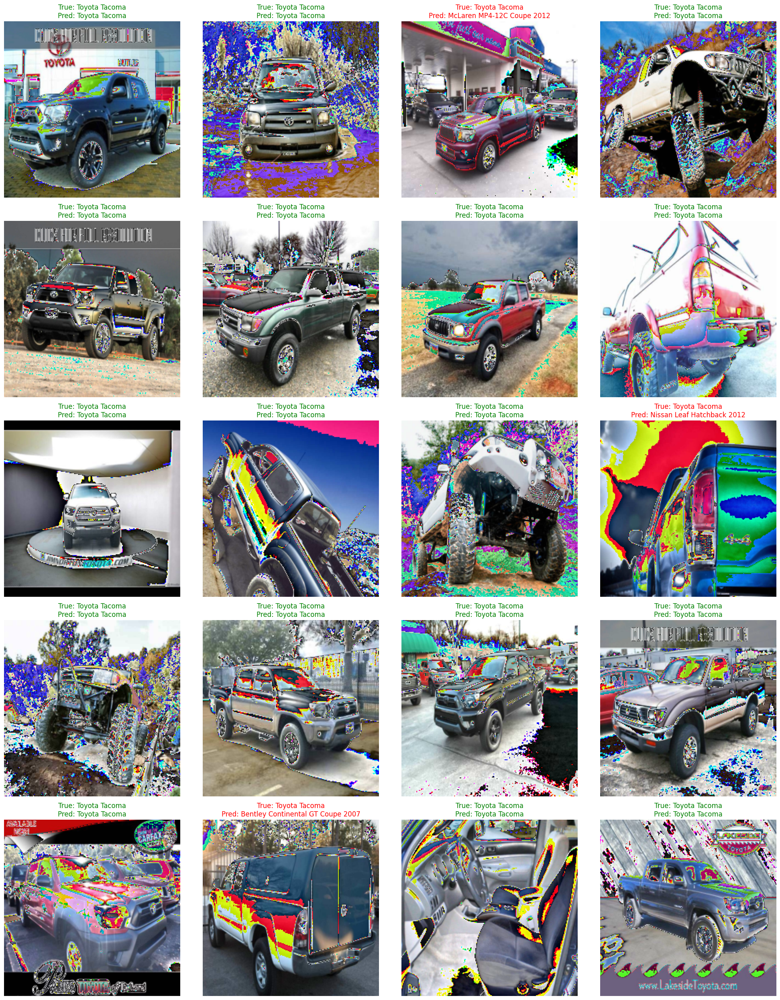

In [6]:
# Set device (GPU if available, else CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the model to the selected device
model = model.to(device)

# Calculate Overall Test Accuracy for the New Class
model.eval()
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
misclassified = 0
total_toyota_tacoma = 0

images_list, true_labels, pred_labels = [], [], []  # To store Toyota Tacoma predictions for visualization

with torch.no_grad():
    for images, labels in test_loader:
        # Move input data to the same device as the model
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        # Check if the label is "Toyota Tacoma"
        if labels.item() == new_class_number:  # Match with numeric class
            total_toyota_tacoma += 1
            if preds.item() != labels.item():
                misclassified += 1

            # Collect data for visualization
            images_list.append(images.cpu().squeeze(0))  # Save image
            true_labels.append(labels.item())  # Save true label
            pred_labels.append(preds.item())  # Save predicted label

accuracy = 1 - (misclassified / total_toyota_tacoma)
print(f"\n'Toyota Tacoma' Test Accuracy: {accuracy * 100:.2f}%")
print(f"Misclassified 'Toyota Tacoma' Images: {misclassified}/{total_toyota_tacoma}")

# Visualization Function
def visualize_toyota_tacoma_predictions(images_list, true_labels, pred_labels, class_labels, num_samples=20):
    """
    Visualize predictions for the 'Toyota Tacoma' class.
    """
    # Determine grid size (4 images per row)
    num_rows = (min(len(images_list), num_samples) + 3) // 4  # Ceiling division for rows
    fig, axs = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
    axs = axs.flatten()  # Flatten the grid for easy indexing

    for i, ax in enumerate(axs[:min(len(images_list), num_samples)]):
        ax.imshow(to_pil_image(images_list[i]))
        ax.set_title(
            f"True: {class_labels[true_labels[i]]}\nPred: {class_labels[pred_labels[i]]}",
            color="green" if true_labels[i] == pred_labels[i] else "red"
        )
        ax.axis("off")

    # Hide unused axes
    for ax in axs[min(len(images_list), num_samples):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# Class label mapping
class_labels = {row["class"]: row["labels"] for _, row in df_train.iterrows()}

# Visualize predictions for Toyota Tacoma
visualize_toyota_tacoma_predictions(
    images_list, true_labels, pred_labels, class_labels, num_samples=20
)


As seen, the model classifies pretty well the Toyota Tacoma class, which might be explained due to the vehicle shape.

## Part 3: **Pretrained Models Results:**### Models to be used:
1. VGG16
2. ResNet34
3. DenseNet169
4. Efficientnet_b0


In [14]:
def train_with_validation_batch(model, train_loader, val_loader, criterion, optimizer, num_epochs, device):
    model = model.to(device)
    best_val_loss = float('inf')
    best_model_state = None
    print(f'now training model: {model.__class__.__name__}')

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        for batch_idx, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()  # Clear gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Compute loss
            loss.backward()  # Backward pass
            optimizer.step()  # Update weights

            train_loss += loss.item() * images.size(0)  # Accumulate loss for the batch

            # Print batch progress
            if (batch_idx + 1) % 10 == 0 or (batch_idx + 1) == len(train_loader):
                print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for batch_idx, (images, labels) in enumerate(val_loader):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)  # Accumulate loss for the batch
                _, predicted = torch.max(outputs, 1)
                correct += (predicted == labels).sum().item()
                total += labels.size(0)

                # Optional: Print validation batch progress
                if (batch_idx + 1) % 10 == 0 or (batch_idx + 1) == len(val_loader):
                    print(f"Validation Batch [{batch_idx+1}/{len(val_loader)}]")

        # Calculate average losses and accuracy
        train_loss /= len(train_loader.dataset)
        val_loss /= len(val_loader.dataset)
        val_accuracy = correct / total * 100

        # Save the best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict()

        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"  Training Loss: {train_loss:.4f}")
        print(f"  Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%\n")

    # Load the best model weights
    model.load_state_dict(best_model_state)
    return model, best_val_loss, val_accuracy


In [15]:
import torchvision.models as models
from torchvision.transforms import transforms

data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

from torch.utils.data import random_split

# Define the dataset sizes
val_split = 0.2  # Fraction of data for validation
train_size = int((1 - val_split) * len(train_dataset))
val_size = len(train_dataset) - train_size

# Split the dataset
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

num_classes=len(df_train['class'].unique())

vgg16 = models.vgg16(pretrained=True)
vgg16.classifier[6] = nn.Linear(4096, num_classes)

resnet34 = models.resnet34(pretrained=True)
resnet34.fc = nn.Linear(512, num_classes)

densenet169 = models.densenet169(pretrained=True)
densenet169.classifier = nn.Linear(1664, num_classes)

efficientnet_b0 = models.efficientnet_b0(pretrained=True)
efficientnet_b0.classifier[1] = nn.Linear(efficientnet_b0.classifier[1].in_features, num_classes)

modelss = [vgg16, resnet34, densenet169, efficientnet_b0]

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 213MB/s] 
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 223MB/s]
Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:04<00:00, 12.8MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 229MB/s]


In [16]:
import torch.optim as optim

train_loader = DataLoader(train_dataset, shuffle=True, num_workers=4, batch_size=64)
val_loader = DataLoader(val_dataset, shuffle=False, num_workers=4, batch_size=64)
test_loader = DataLoader(test_dataset, shuffle=False, num_workers=4, batch_size=64)
torch.use_deterministic_algorithms(True, warn_only=True)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cri = nn.CrossEntropyLoss()

fitted = []

for model in modelss:
    fitted.append(train_with_validation_batch(model, train_loader, val_loader, nn.CrossEntropyLoss(),optim.Adam(model.parameters(), lr = 0.0001), 10, device))

now training model: VGG
Epoch [1/10], Batch [10/102], Loss: 5.2753
Epoch [1/10], Batch [20/102], Loss: 5.2764
Epoch [1/10], Batch [30/102], Loss: 5.2719
Epoch [1/10], Batch [40/102], Loss: 5.2429
Epoch [1/10], Batch [50/102], Loss: 5.2289
Epoch [1/10], Batch [60/102], Loss: 5.2056
Epoch [1/10], Batch [70/102], Loss: 4.9300
Epoch [1/10], Batch [80/102], Loss: 5.0385
Epoch [1/10], Batch [90/102], Loss: 4.6771
Epoch [1/10], Batch [100/102], Loss: 4.5659
Epoch [1/10], Batch [102/102], Loss: 4.6634
Validation Batch [10/26]
Validation Batch [20/26]
Validation Batch [26/26]
Epoch 1/10
  Training Loss: 5.0609
  Validation Loss: 4.3425, Validation Accuracy: 5.65%

Epoch [2/10], Batch [10/102], Loss: 4.3630
Epoch [2/10], Batch [20/102], Loss: 3.7933
Epoch [2/10], Batch [30/102], Loss: 3.9558
Epoch [2/10], Batch [40/102], Loss: 3.4019
Epoch [2/10], Batch [50/102], Loss: 3.6329
Epoch [2/10], Batch [60/102], Loss: 3.4236
Epoch [2/10], Batch [70/102], Loss: 3.2112
Epoch [2/10], Batch [80/102], Loss:

In [17]:
def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    correct_samples = set()
    error_samples = set()

    # Initialize a counter to simulate sample IDs
    global_counter = 0

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(dataloader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            correct_mask = (predicted == labels)

            correct += correct_mask.sum().item()
            total += labels.size(0)

            # Track sample indices
            for i in range(len(labels)):
                sample_id = global_counter + i
                if correct_mask[i]:
                    correct_samples.add(sample_id)
                else:
                    error_samples.add(sample_id)

            # Update the global counter
            global_counter += len(labels)

    avg_loss = total_loss / total
    accuracy = correct / total * 100
    return avg_loss, accuracy, len(correct_samples), len(error_samples)


def model_summary(model):
    """
    Counts the number of trainable parameters in the model.
    """
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cri = nn.CrossEntropyLoss()

for model in fitted:
    print(f'model: {model[0].__class__.__name__}')
    t_loss, t_acc, num_cor, num_err = evaluate_model(model[0], test_loader, cri, device)
    print(f'parameters: {model_summary(model[0])}')
    print(f'validation loss: {model[1]}')
    print(f'validation accuracy: {model[2]}')
    print(f'test loss: {t_loss}')
    print(f'test accuracy: {t_acc}')
    print(f'# of unique correct samples: {num_cor}')
    print(f'# of unique errors: {num_err}')
    print('/--------------------')

model: VGG
parameters: 135063556
validation loss: 1.1214691386623863
validation accuracy: 72.74401473296501
test loss: 1.0968496655664728
test accuracy: 73.85897276458152
# of unique correct samples: 5939
# of unique errors: 2102
/--------------------
model: ResNet
parameters: 21385220
validation loss: 0.9128323484228168
validation accuracy: 82.44321669736034
test loss: 0.8808137994250793
test accuracy: 83.04937196866061
# of unique correct samples: 6678
# of unique errors: 1363
/--------------------
model: DenseNet
parameters: 12810820
validation loss: 0.6420134651360884
validation accuracy: 86.06507059545734
test loss: 0.6283214214265888
test accuracy: 86.34498196741698
# of unique correct samples: 6943
# of unique errors: 1098
/--------------------
model: EfficientNet
parameters: 4258624
validation loss: 0.8127560884108055
validation accuracy: 80.23327194597913
test loss: 0.8117859581115456
test accuracy: 79.57965427185674
# of unique correct samples: 6399
# of unique errors: 1642
/

| **Model**        | **Parameters** | **Validation Loss** | **Validation Accuracy (%)** | **Test Loss** | **Test Accuracy (%)** | **# Unique Correct Samples** | **# Unique Errors** |
|-------------------|----------------|----------------------|-----------------------------|---------------|------------------------|-----------------------------|----------------------|
| **VGG**          | 135,063,556    | 1.121469            | 72.74                       | 1.096850      | 73.86                 | 5939                        | 2102                 |
| **ResNet**       | 21,385,220     | 0.912832            | 82.44                       | 0.880814      | 83.05                 | 6678                        | 1363                 |
| **DenseNet**     | 12,810,820     | 0.642013            | 86.07                       | 0.628321      | 86.34                 | 6943                        | 1098                 |
| **EfficientNet** | 4,258,624      | 0.812756            | 80.23                       | 0.811786      | 79.58                 | 6399                        | 1642                 |


In [2]:
from torch.utils.data import Dataset, DataLoader, Subset
class CarsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe['fname'].iloc[idx]
        bbox = (
            int(self.dataframe['x1'].iloc[idx]),
            int(self.dataframe['y1'].iloc[idx]),
            int(self.dataframe['x2'].iloc[idx]),
            int(self.dataframe['y2'].iloc[idx]),
        )
        image = Image.open(img_path).convert('RGB')
        cropped_image = image.crop(bbox)

        if self.transform:
            cropped_image = self.transform(cropped_image)

        label = self.dataframe['class'].iloc[idx]
        return cropped_image, label

In [21]:
def train_with_scheduler(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs, device, freeze_epochs=2):
    model = model.to(device)
    best_val_loss = float('inf')
    best_model_state = None

    # Freeze pretrained layers initially
    for param in model.parameters():
        param.requires_grad = False

    # Identify the layer to unfreeze for fine-tuning
    if hasattr(model, "classifier"):  # For models like DenseNet
        trainable_layer = model.classifier
    elif hasattr(model, "fc"):  # For models like ResNet
        trainable_layer = model.fc
    else:
        raise AttributeError("The model does not have a known classifier or fc attribute for fine-tuning.")

    # Unfreeze the trainable layer
    for param in trainable_layer.parameters():
        param.requires_grad = True

    for epoch in range(num_epochs):
        # Unfreeze all layers after freeze_epochs
        if epoch == freeze_epochs:
            print("Unfreezing pretrained layers...")
            for param in model.parameters():
                param.requires_grad = True

        # Training phase
        model.train()
        train_loss = 0.0
        for batch_idx, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs, 1)
                correct += (predicted == labels).sum().item()
                total += labels.size(0)

        # Adjust learning rate
        scheduler.step()

        # Calculate average losses and accuracy
        train_loss /= len(train_loader.dataset)
        val_loss /= len(val_loader.dataset)
        val_accuracy = correct / total * 100

        # Save the best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict()

        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"  Training Loss: {train_loss:.4f}")
        print(f"  Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%\n")

    # Load the best model weights
    model.load_state_dict(best_model_state)

    # Return the best model, loss, and accuracy
    return model, best_val_loss, val_accuracy


In [4]:
import torchvision.models as models
from torchvision.transforms import transforms
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from sklearn.model_selection import KFold
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import transforms, functional as F
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    # transforms.RandomHorizontalFlip(),  # New augmentation
    # transforms.RandomRotation(15),      # New augmentation
    # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # New augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_dataset = CarsDataset(df_train, transform=data_transforms)
test_dataset = CarsDataset(df_test, transform=data_transforms)

from torch.utils.data import random_split

# Define the dataset sizes
val_split = 0.2  # Fraction of data for validation
train_size = int((1 - val_split) * len(train_dataset))
val_size = len(train_dataset) - train_size

# Split the dataset
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

num_classes=len(df_train['class'].unique())

vgg16 = models.vgg16(pretrained=True)
vgg16.classifier[6] = nn.Linear(vgg16.classifier[6].in_features, num_classes)

resnet50 = models.resnet50(pretrained=True)
resnet50.fc = nn.Linear(resnet50.fc.in_features, num_classes)

densenet169 = models.densenet169(pretrained=True)
densenet169.classifier = nn.Linear(densenet169.classifier.in_features, num_classes)

efficientnet_b4 = models.efficientnet_b4(pretrained=True)
efficientnet_b4.classifier[1] = nn.Linear(efficientnet_b4.classifier[1].in_features, num_classes)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 218MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future.

In [22]:
# Assuming VGG16 is already loaded as `vgg16` and DataLoader is configured
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR

# Define optimizer and scheduler
optimizer = Adam(filter(lambda p: p.requires_grad, vgg16.parameters()), lr=1e-3)
scheduler = StepLR(optimizer, step_size=3, gamma=0.5)
train_loader = DataLoader(train_dataset, shuffle=True, num_workers=4, batch_size=64)
val_loader = DataLoader(val_dataset, shuffle=False, num_workers=4, batch_size=64)
test_loader = DataLoader(test_dataset, shuffle=False, num_workers=4, batch_size=64)
# Train with the modified function
fitted_model, best_loss, best_accuracy = train_with_scheduler_vgg16(
    vgg16,
    train_loader,
    val_loader,
    nn.CrossEntropyLoss(),
    optimizer,
    scheduler,
    num_epochs=10,
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    num_classes=196,  # Update with the correct number of classes
    freeze_epochs=4
)


Calculated input size for VGG16 classifier: 25088
Epoch 1/10
  Training Loss: 5.2780
  Validation Loss: 5.2787, Validation Accuracy: 0.25%

Epoch 2/10
  Training Loss: 5.2780
  Validation Loss: 5.2787, Validation Accuracy: 0.25%

Epoch 3/10
  Training Loss: 5.2780
  Validation Loss: 5.2787, Validation Accuracy: 0.25%

Epoch 4/10
  Training Loss: 5.2780
  Validation Loss: 5.2787, Validation Accuracy: 0.25%

Unfreezing pretrained layers...
Epoch 5/10
  Training Loss: 5.2781
  Validation Loss: 5.2787, Validation Accuracy: 0.25%

Epoch 6/10
  Training Loss: 5.2781
  Validation Loss: 5.2787, Validation Accuracy: 0.25%



KeyboardInterrupt: 

In [13]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
import time
modelss = [vgg16, resnet50, densenet169, efficientnet_b4]
train_loader = DataLoader(train_dataset, shuffle=True, num_workers=4, batch_size=64)
val_loader = DataLoader(val_dataset, shuffle=False, num_workers=4, batch_size=64)
test_loader = DataLoader(test_dataset, shuffle=False, num_workers=4, batch_size=64)
torch.use_deterministic_algorithms(True, warn_only=True)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()


fitted = []
timings = []

for model in modelss[:1]:
    print(f'model: {model.__class__.__name__}')
    optimizer = optim.Adam(model.parameters(), lr=0.01)
    scheduler = StepLR(optimizer, step_size=3, gamma=0.3)
    start_time = time.time()
    fitted_model, best_loss, best_accuracy = train_with_scheduler(model, train_loader, val_loader, criterion, optimizer, scheduler, 10, device, 4)
    end_time = time.time() - start_time

    fitted.append(fitted_model)
    timings.append(end_time)

model: VGG
Adding additional layers to VGG16...


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.
